In [9]:
from DCC import *
from Utils import *
from Plots import *
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
init_plotting()

In [ ]:
colors = ["#ff595e","#8ac926","#6a4c93","#1775B1"]
my_cmap = sns.color_palette(colors)
sns.set_palette(my_cmap)

In [10]:
def mix(ratio, linear_data, random_data, seed=0):
    """
    Mix linear and random data.
    ratio: float, the ratio of linear data in the mixed data.
    linear_data: pd.DataFrame, linear data.
    random_data: pd.DataFrame, random data.
    return: pd.DataFrame, mixed data.
    """
    np.random.seed(int(seed * 1000))
    # Calculate how many samples to take from each dataset
    n_linear = int(ratio * len(linear_data))
    n_random = len(linear_data) - n_linear
    
    # Sample from each dataset
    part_linear_data = linear_data.sample(n=n_linear)
    part_random_data = random_data.sample(n=n_random)
    
    # Combine datasets
    mixed_data = pd.concat([part_linear_data, part_random_data])
    mixed_data.reset_index(drop=True, inplace=True)
    return mixed_data

In [5]:
def test_generate_regression_df(n=500, m=10, noise=0.1, seed=0, n_informative=None):
    """
    Generate a regression dataset with a linear relationship and some noise.
    n: int, number of samples.
    noise: float, standard deviation of the Gaussian noise added to the linear relationship.
    seed: int, random seed for reproducibility.
    return: pd.DataFrame, regression dataset.
    """
    np.random.seed(seed)
    X = np.random.rand(n, m)
    coef = np.random.randn(m)

    y = X @ coef
    data = pd.DataFrame(X, columns=[f"feature_{i}" for i in range(m)])
    data["target"] = y
    return data, coef, X, y

<Axes: >

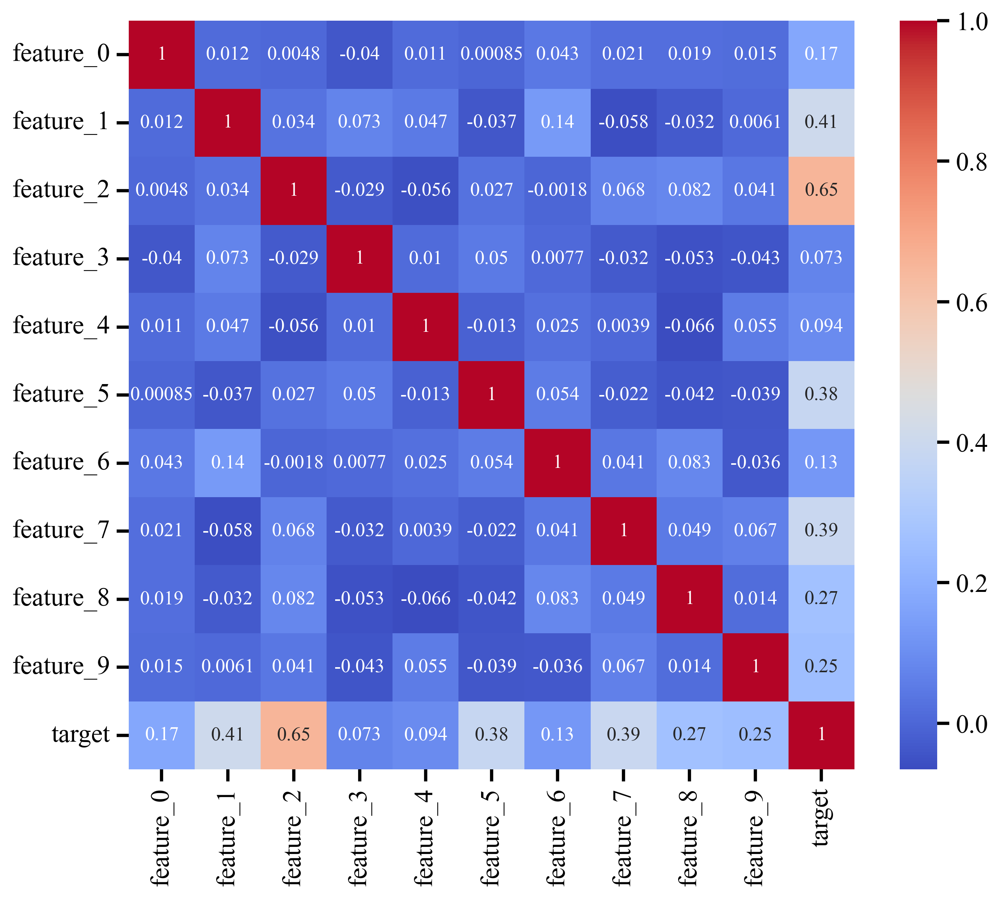

In [6]:
# test_df, test_coef, test_X, test_y = test_generate_regression_df(n=500, m=10, noise=0)
test_df = generate_regression_df(n=500, m=10, noise=0)
plt.figure(figsize=(10, 8))
sns.heatmap(test_df.corr(), annot=True, cmap="coolwarm")

In [7]:
sns.pairplot(test_df)

KeyboardInterrupt: 

In [ ]:
def exp_eps(seed, n, m, eps, mix_ratio=0.5):
    # linear data
    np.random.seed(seed)
    linear_data = generate_regression_df(n=n, m=m, n_informative=m, noise=0)
    random_data = generate_random_df(n=n, m=m)

    # mix linear and random data
    mixed_data = mix(mix_ratio, linear_data, random_data, seed=seed)
    dcc_scores = []
    for e in eps:
        dcc_scores.append(repeated_avg_dcc(data=mixed_data, ratio=0.1, eps=e))
    return dcc_scores


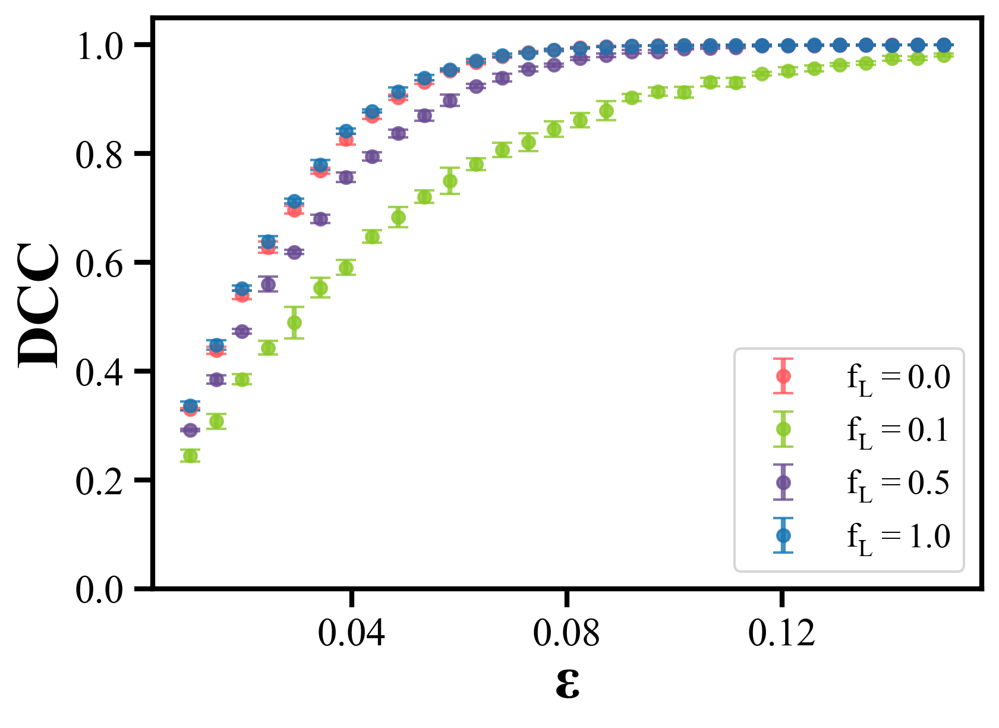

In [ ]:
from matplotlib.ticker import MultipleLocator

seeds = [0, 1, 2, 3, 4]

n = 500
m = 10

# Plot

# plt.figure(figsize=(6, 4))
fig, ax = plt.subplots(figsize=(6, 4))

mix_ratios = [0, 0.1, 0.5, 1.0]
for mix_ratio in mix_ratios:
    eps = np.linspace(0.01, 0.15, 30)
    results = []
    for seed in seeds:
        results.append(exp_eps(seed=seed, n=n, m=m, eps=eps, mix_ratio=mix_ratio))
    results = np.array(results)

    # scatter plot + error bars
    plt.errorbar(eps, results.mean(axis=0), yerr=results.std(axis=0), fmt='o', capsize=4, capthick=1, elinewidth=2, markersize=5, alpha=0.8, label=f"Ratio: {mix_ratio}")
plt.legend([r"$f_L=0.0$", "$f_L=0.1$", "$f_L=0.5$", "$f_L=1.0$"], loc='best', fontsize=14)
plt.xlabel(r"$\epsilon$")
plt.ylabel('DCC')
plt.ylim(0.0, 1.05)
ax.xaxis.set_major_locator(MultipleLocator(0.04))
plt.savefig("plots/dcc_vs_eps.png", dpi=300, bbox_inches='tight')

In [ ]:
def exp_thetas(seed, n, m, thetas, mix_ratio=0.5):
    # linear data
    np.random.seed(seed)
    linear_data = generate_regression_df(n=n, m=m, n_informative=m, noise=0)
    random_data = generate_random_df(n=n, m=m)

    # mix linear and random data
    mixed_data = mix(mix_ratio, linear_data, random_data, seed=seed)
    dcc_scores = []
    for theta in thetas:
        dcc_scores.append(repeated_avg_dcc(data=mixed_data, ratio=theta, eps=0.04))
    return dcc_scores

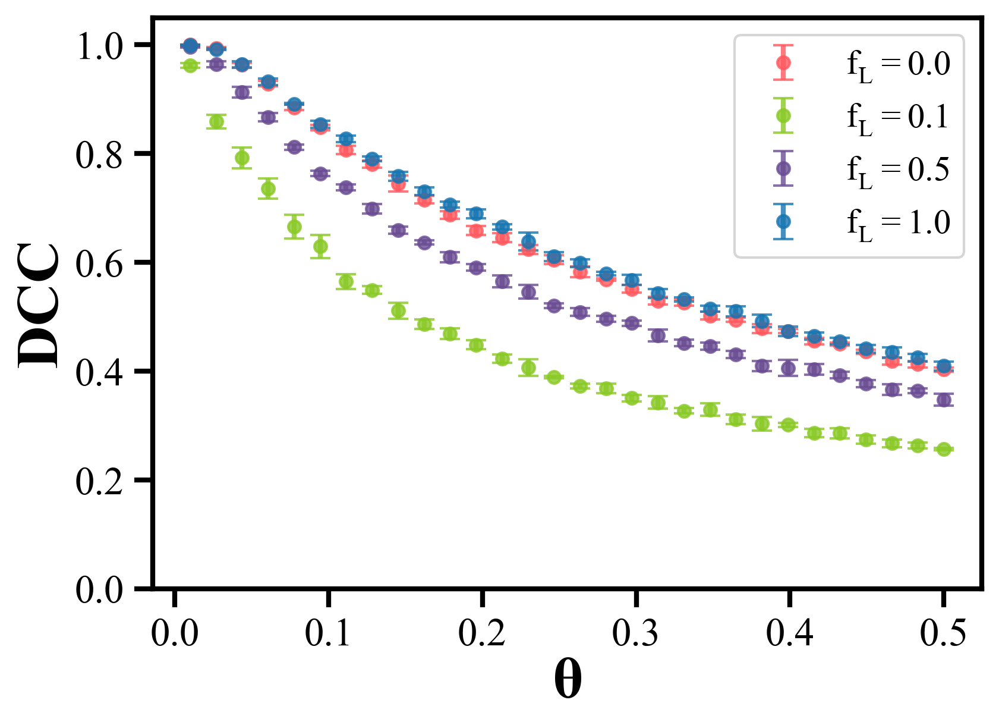

In [ ]:
seeds = [0, 1, 2, 3, 4]

n = 500
m = 10

# Plot
plt.figure(figsize=(6, 4))
mix_ratios = [0, 0.1, 0.5, 1.0]
thetas = np.linspace(0.01, 0.5, 30)
for mix_ratio in mix_ratios:
    results = []

    for seed in seeds:
        results.append(exp_thetas(seed=seed, n=n, m=m, thetas=thetas, mix_ratio=mix_ratio))
    results = np.array(results)
    # scatter plot + error bars
    plt.errorbar(thetas, results.mean(axis=0), yerr=results.std(axis=0), fmt='o', capsize=4, capthick=1, elinewidth=2, markersize=5, alpha=0.8, label=f"Ratio: {mix_ratio}")
plt.legend([r"$f_L=0.0$", "$f_L=0.1$", "$f_L=0.5$", "$f_L=1.0$"], loc='best', fontsize=14)
plt.xlabel(r'$\theta$')
plt.ylabel('DCC')
plt.ylim(0.0, 1.05)
plt.savefig("plots/dcc_vs_thetas.png", dpi=300, bbox_inches='tight')

In [ ]:
def exp_nums(seed, nums, m, mix_ratio=0.5):
    dcc_scores = []
    # linear data
    for n in nums:
        np.random.seed(seed)
        linear_data = generate_regression_df(n=n, m=m, n_informative=m, noise=0)
        random_data = generate_random_df(n=n, m=m)

        # mix linear and random data
        mixed_data = mix(mix_ratio, linear_data, random_data, seed=seed)
        dcc_scores.append(repeated_avg_dcc(data=mixed_data, ratio=0.1, eps=0.04))
    return dcc_scores

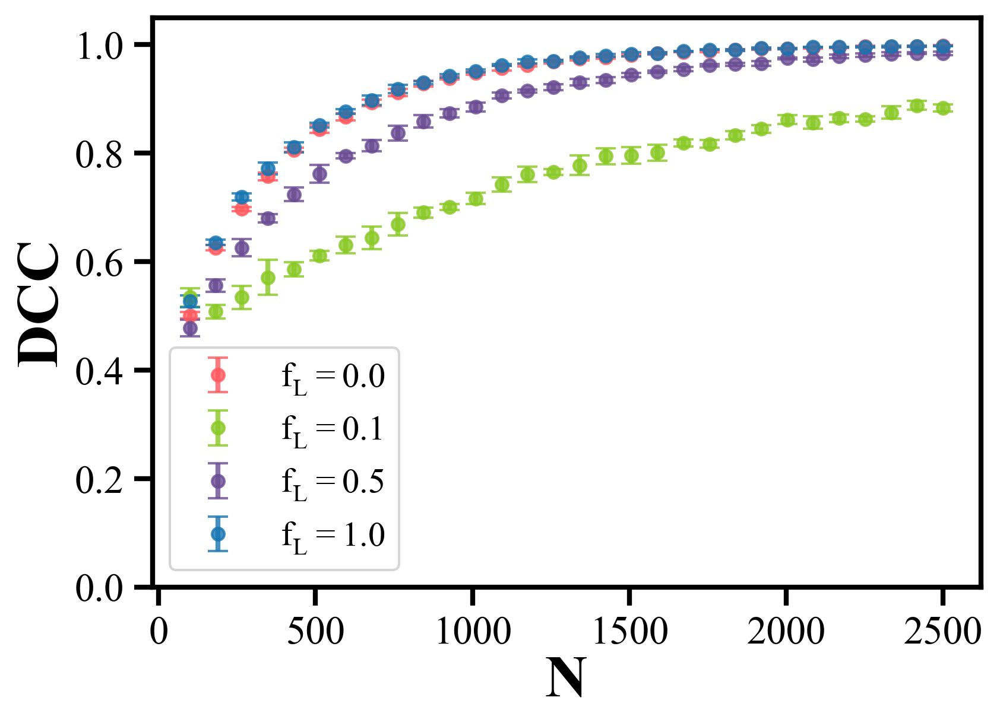

In [ ]:
seeds = [0, 1, 2, 3, 4]

m = 10

# Plot
plt.figure(figsize=(6, 4))
mix_ratios = [0, 0.1, 0.5, 1.0]
nums = np.linspace(100, 2500, 30).astype(int)
for mix_ratio in mix_ratios:
    results = []
    for seed in seeds:
        results.append(exp_nums(seed=seed, nums=nums, m=m, mix_ratio=mix_ratio))
    results = np.array(results)
    # scatter plot + error bars
    plt.errorbar(nums, results.mean(axis=0), yerr=results.std(axis=0), fmt='o', capsize=4, capthick=1, elinewidth=2, markersize=5, alpha=0.8, label=f"Ratio: {mix_ratio}")
plt.legend([r"$f_L=0.0$", "$f_L=0.1$" ,"$f_L=0.5$", "$f_L=1.0$"], loc='best', fontsize=14)
# sns.scatterplot(x=eps, y=results.mean(axis=0), s=20, alpha=0.5)
plt.xlabel('N')
plt.ylabel('DCC')
plt.ylim(0.0, 1.05)
plt.savefig("plots/dcc_vs_nums.png", dpi=300, bbox_inches='tight')

In [ ]:
def exp_features(seed, n, features, mix_ratio=0.5):
    dcc_scores = []
    # linear data
    for f in features:
        np.random.seed(seed)
        linear_data = generate_regression_df(n=n, m=f, n_informative=f, noise=0)
        random_data = generate_random_df(n=n, m=f)

        # mix linear and random data
        mixed_data = mix(mix_ratio, linear_data, random_data, seed=seed)
        dcc_scores.append(repeated_avg_dcc(data=mixed_data, ratio=0.1, eps=0.04))
    return dcc_scores

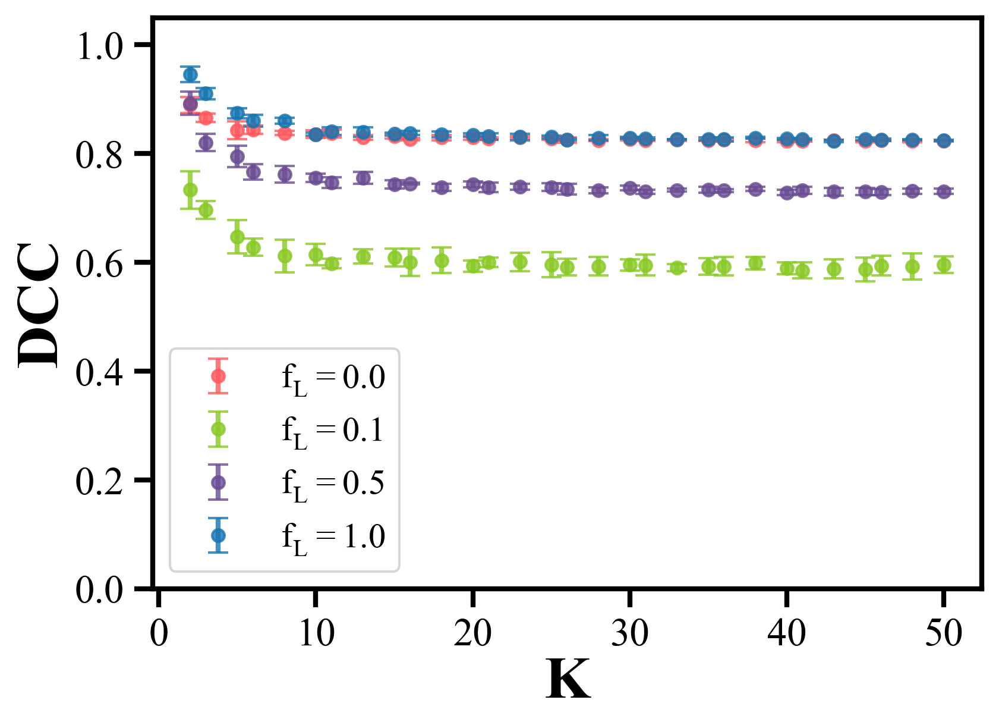

In [ ]:
seeds = [0, 1, 2, 3, 4]

n = 500

# Plot
plt.figure(figsize=(6, 4))
mix_ratios = [0,0.1, 0.5, 1.0]
features = np.linspace(2, 50, 30).astype(int)
for mix_ratio in mix_ratios:
    results = []
    for seed in seeds:
        results.append(exp_features(seed=seed, n=n, features=features, mix_ratio=mix_ratio))
    results = np.array(results)
    # scatter plot + error bars
    plt.errorbar(features, results.mean(axis=0), yerr=results.std(axis=0), fmt='o', capsize=4, capthick=1, elinewidth=2, markersize=5, alpha=0.8, label=f"Ratio: {mix_ratio}")

plt.legend([r"$f_L=0.0$", "$f_L=0.1$", "$f_L=0.5$", "$f_L=1.0$"], loc='best', fontsize=14)
plt.ylim(0.0, 1.05)
plt.xlabel('K')
plt.ylabel('DCC')
plt.savefig("plots/dcc_vs_features.png", dpi=300, bbox_inches='tight')

In [ ]:
def exp_linear_ratios(seed, n, m, ratios, corr_func=pearson_matrix):
    # linear data
    np.random.seed(seed)
    linear_data = generate_regression_df(n=n, m=m, n_informative=m, noise=0)
    random_data = generate_random_df(n=n, m=m)

    # mix linear and random data
    dcc_scores = []
    for ratio in ratios:
        mixed_data = mix(ratio, linear_data, random_data, ratio)
        dcc_scores.append(repeated_avg_dcc(data=mixed_data, ratio=0.1, eps=0.04, corr_func=corr_func))
    return dcc_scores

Running for Pearson correlation function
Running for MI correlation function
Running for WD correlation function


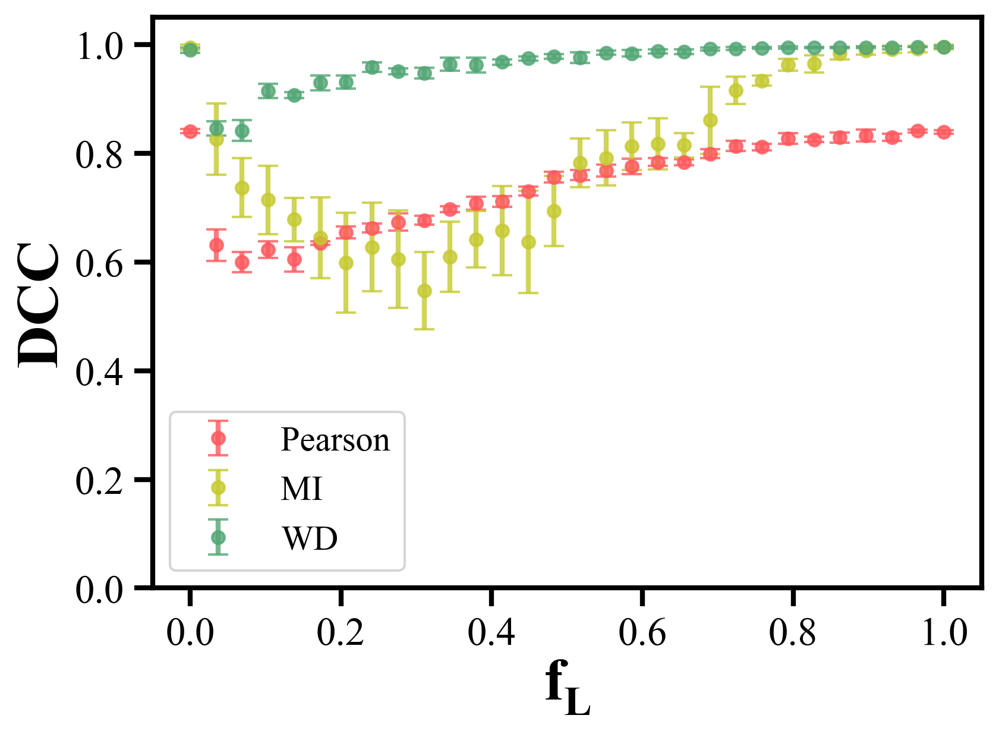

In [ ]:
seeds = [0, 1, 2, 3, 4]
colors = ["#ff595e","#c5ca30","#52a675"]
my_cmap = sns.color_palette(colors)
sns.set_palette(my_cmap)

corr_funcs = [pearson_matrix, mutual_info_matrix, wd_corr_matrix]
corr_name = ["Pearson", "MI", "WD"]
plt.figure(figsize=(6, 4))

for corr_func in corr_funcs:
    print(f"Running for {corr_name[corr_funcs.index(corr_func)]} correlation function")
    n = 500
    m = 10
    results = []
    ratios = np.linspace(0, 1, 30)

    for seed in seeds:
        results.append(exp_linear_ratios(seed=seed, n=n, m=m, ratios=ratios, corr_func=corr_func))

    results = np.array(results)
    plt.errorbar(
        ratios,
        results.mean(axis=0),
        yerr=results.std(axis=0),
        fmt="o",
        capsize=4,
        capthick=1,
        elinewidth=2,
        markersize=5,
        alpha=0.8,
        label=f"{corr_name[corr_funcs.index(corr_func)]}",
    )

plt.ylim(0.0, 1.05)
plt.legend(loc="best", fontsize=14)
plt.xlabel(r"$f_{L}$")
plt.ylabel("DCC")
plt.savefig("plots/dcc_linear_ratio.png", dpi=300, bbox_inches="tight")

Running for Pearson correlation function
Running for MI correlation function
Running for WD correlation function
Running for Kendall correlation function
Running for Spearman correlation function
Running for JS correlation function
Running for DCor correlation function


Text(0, 0.5, 'DCC')

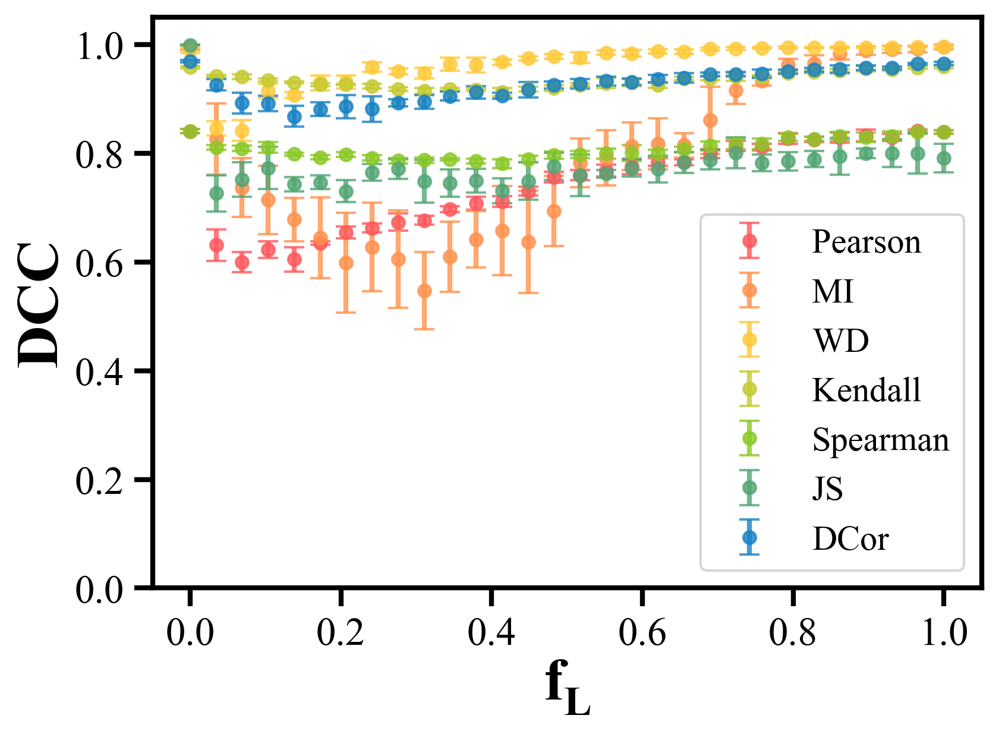

In [ ]:
seeds = [0, 1, 2, 3, 4]
colors = ["#ff595e","#ff924c","#ffca3a","#c5ca30","#8ac926","#52a675","#1982c4","#4267ac","#6a4c93"]
my_cmap = sns.color_palette(colors)
sns.set_palette(my_cmap)
corr_funcs = [pearson_matrix, mutual_info_matrix, wd_corr_matrix, kendall_matrix, spearman_matrix, js_corr_matrix, dcor_matrix]
corr_name = ["Pearson", "MI", "WD", "Kendall", "Spearman", "JS", "DCor"]
plt.figure(figsize=(6, 4))

for corr_func in corr_funcs:
    print(f"Running for {corr_name[corr_funcs.index(corr_func)]} correlation function")
    n = 500
    m = 10
    results = []
    ratios = np.linspace(0, 1, 30)

    for seed in seeds:
        results.append(exp_linear_ratios(seed=seed, n=n, m=m, ratios=ratios, corr_func=corr_func))

    results = np.array(results)
    plt.errorbar(
        ratios,
        results.mean(axis=0),
        yerr=results.std(axis=0),
        fmt="o",
        capsize=4,
        capthick=1,
        elinewidth=2,
        markersize=5,
        alpha=0.8,
        label=f"{corr_name[corr_funcs.index(corr_func)]}",
    )

plt.ylim(0.0, 1.05)
plt.legend(loc="best", fontsize=14)
plt.xlabel(r"$f_{L}$")
plt.ylabel("DCC")
# plt.savefig("plots/dcc_linear_ratio.png", dpi=300, bbox_inches="tight")

In [ ]:
from joblib import Parallel, delayed
import numpy as np

def dcc_difference(data: pd.DataFrame, ratio=0.1, eps=0.01, corr_func=pearson_matrix):
    """
    计算原始数据和删除部分数据后的相关系数矩阵的差
    :param data: pd.DataFrame, 数据
    :param ratio: float, 要删除的数据比例
    :param eps: float, 阈值
    :param corr_func: function, 相关函数
    :return : diff: pd.DataFrame, 相关系数矩阵的差异
    """
    if ratio == 0.0:
        return pd.DataFrame(np.zeros((data.shape[1], data.shape[1])), index=data.columns, columns=data.columns)
    eps /= 2
    corr_1 = corr_func(data)  # 计算原始数据的相关系数矩阵
    sampled_data = data.sample(frac=1 - ratio, axis=0)  # 随机删除部分数据
    corr_2 = corr_func(sampled_data)  # 计算删除部分数据后的相关系数矩阵
    diff = corr_1 - corr_2  # 计算两个矩阵的差异
    return diff

def flatten_corr(df):
    arr = df.values
    return arr[np.triu_indices_from(arr, k=1)]  # 只取上三角（不含对角线）

def exp_corrs(seed, n, m, ratios, corr_func):
    """
    单个 seed + corr_func 的实验
    """
    np.random.seed(seed)
    linear_data = generate_regression_df(n=n, m=m, n_informative=m, noise=0)
    random_data = generate_random_df(n=n, m=m)

    def _compute_corr(ratio):
        mixed_data = mix(ratio, linear_data, random_data, ratio)
        
        corr_diff = dcc_difference(mixed_data, ratio=0.1, eps=0.04, corr_func=corr_func)
    
        # 只取上三角（不含对角线）
        return flatten_corr(corr_diff)


    results = [_compute_corr(r) for r in ratios]
    return np.concatenate(results)


def run_all_corrs(seeds, n, m, ratios, corr_funcs, corr_names, n_jobs=-1):
    """
    同时并行化 corr_func × seed × ratio
    返回 dict: {corr_name: array of correlations}
    """
    tasks = [
        (corr_func, corr_name, seed)
        for corr_func, corr_name in zip(corr_funcs, corr_names)
        for seed in seeds
    ]
    print(f"Running {len(tasks)} tasks in parallel...")

    def _task(corr_func, corr_name, seed):
        return corr_name, exp_corrs(seed, n, m, ratios, corr_func)

    results = Parallel(n_jobs=n_jobs)(
        delayed(_task)(func, name, seed) for func, name, seed in tasks
    )
    # 聚合结果：同一个 corr_name 合并
    corr_dict = {name: [] for name in corr_names}
    for name, arr in results:
        corr_dict[name].append(arr)

    # # 每种 corr_name 拼接成一个 array
    # for name in corr_dict:
    #     corr_dict[name] = np.concatenate(corr_dict[name])

    return corr_dict


Running for linear ratio: 0.1
Running 15 tasks in parallel...


<Figure size 1800x1200 with 0 Axes>

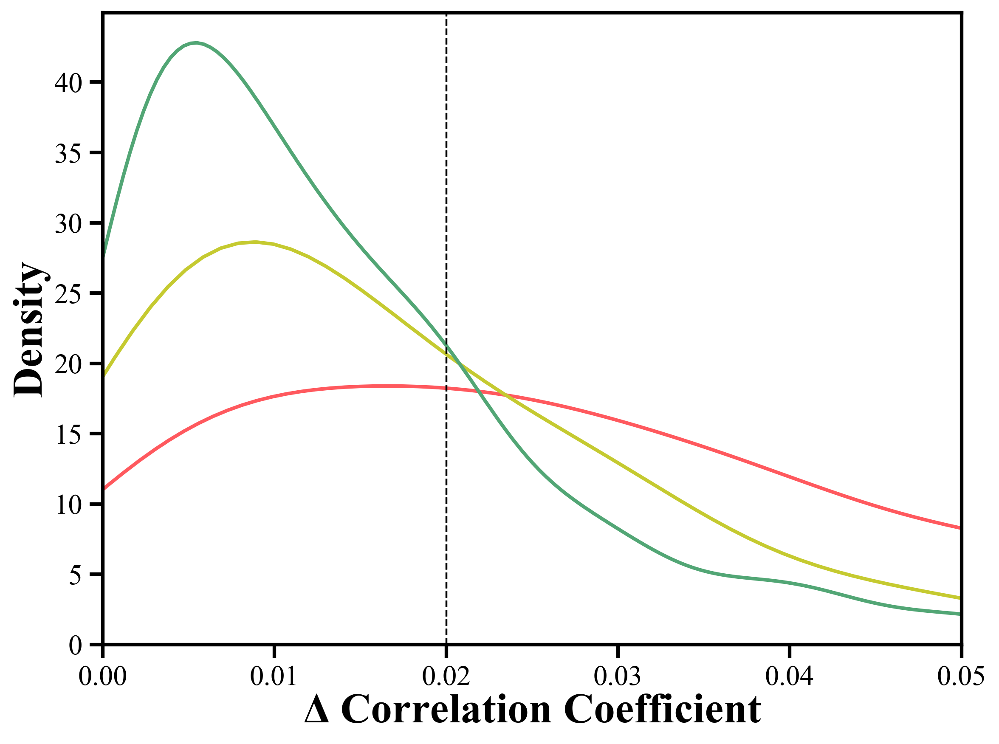

Running for linear ratio: 0.2
Running 15 tasks in parallel...


<Figure size 1800x1200 with 0 Axes>

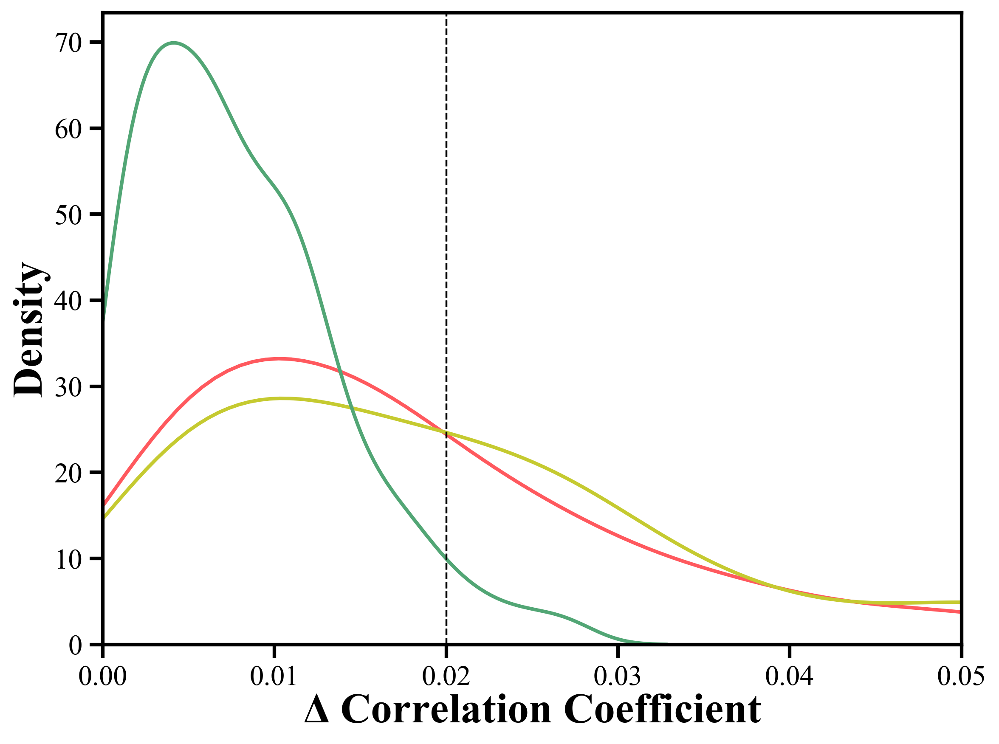

Running for linear ratio: 0.3
Running 15 tasks in parallel...


<Figure size 1800x1200 with 0 Axes>

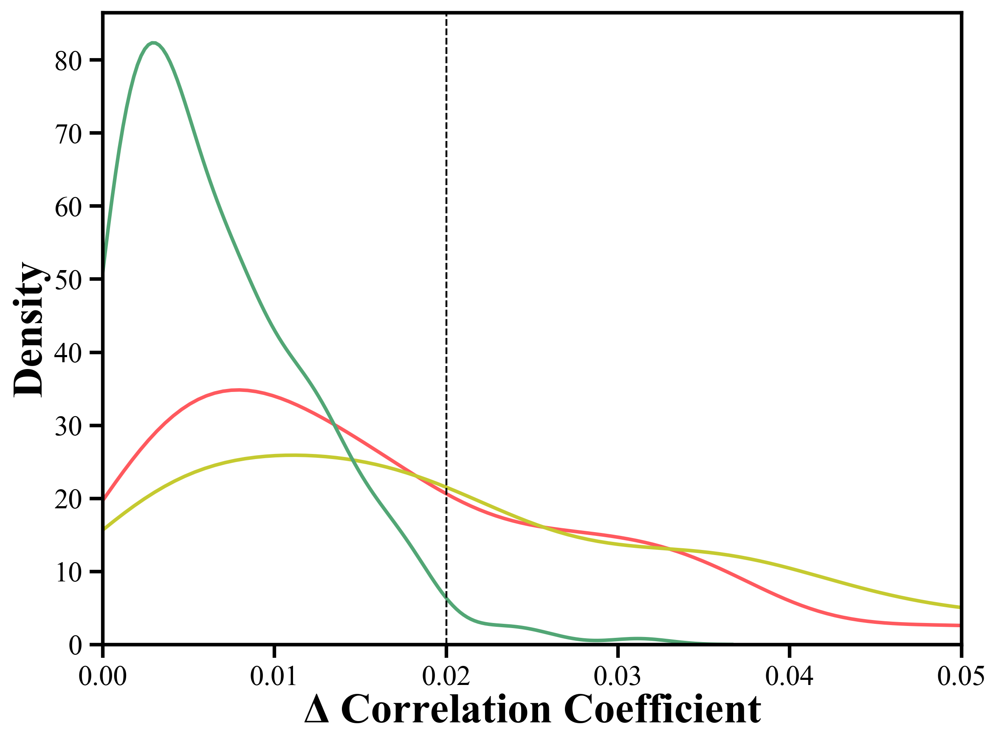

Running for linear ratio: 0.4
Running 15 tasks in parallel...


<Figure size 1800x1200 with 0 Axes>

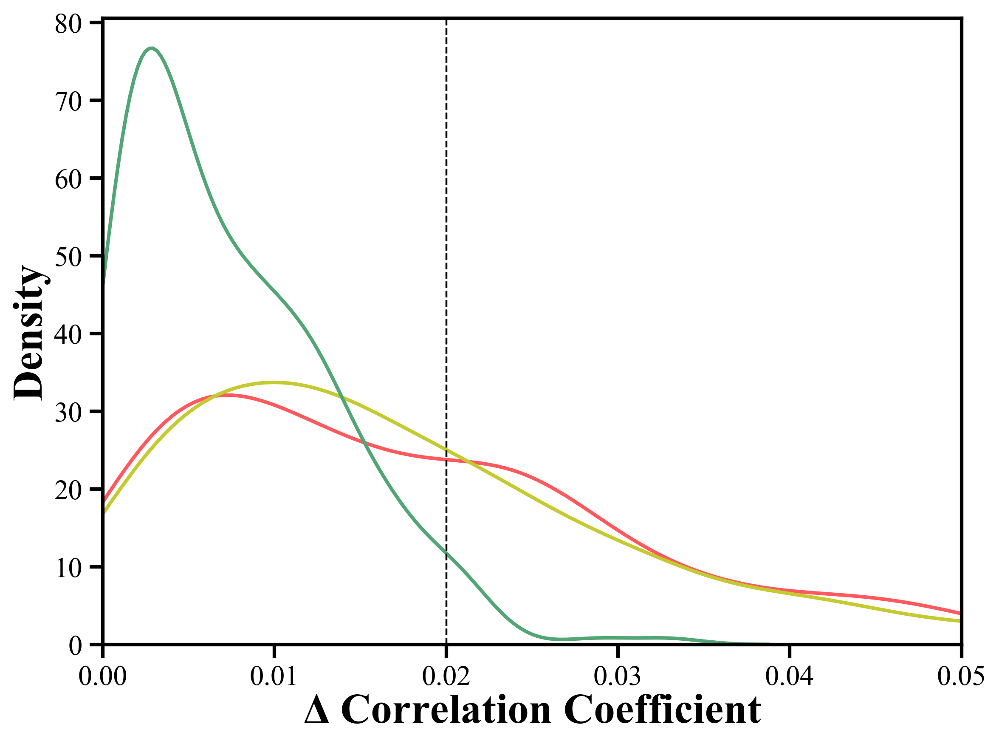

Running for linear ratio: 0.5
Running 15 tasks in parallel...


<Figure size 1800x1200 with 0 Axes>

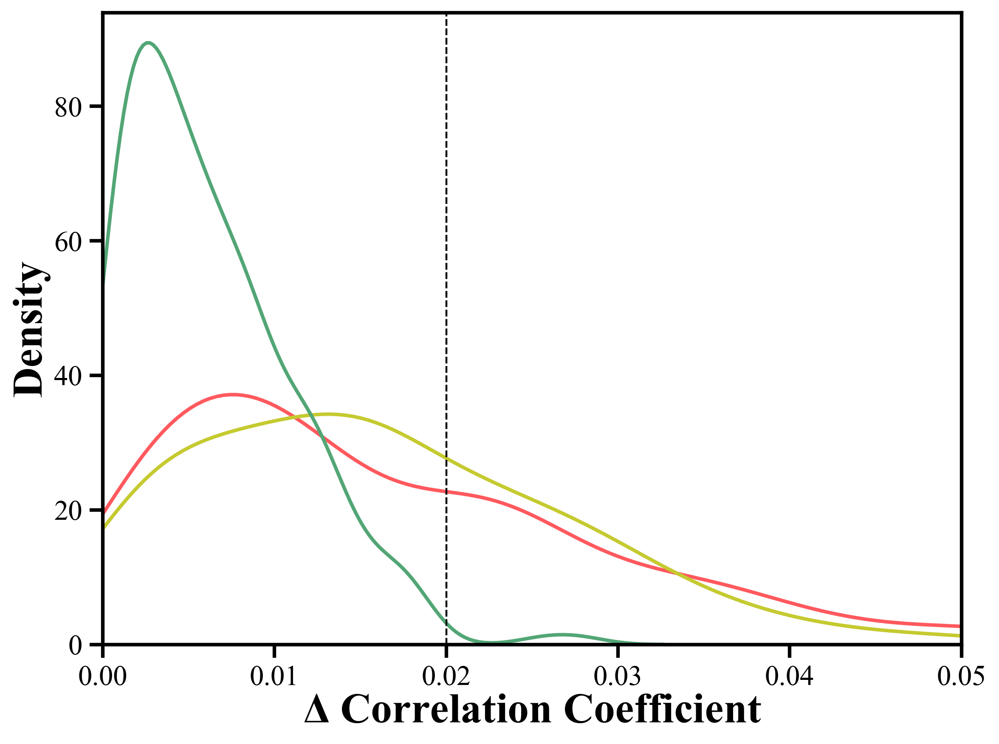

Running for linear ratio: 0.6
Running 15 tasks in parallel...


<Figure size 1800x1200 with 0 Axes>

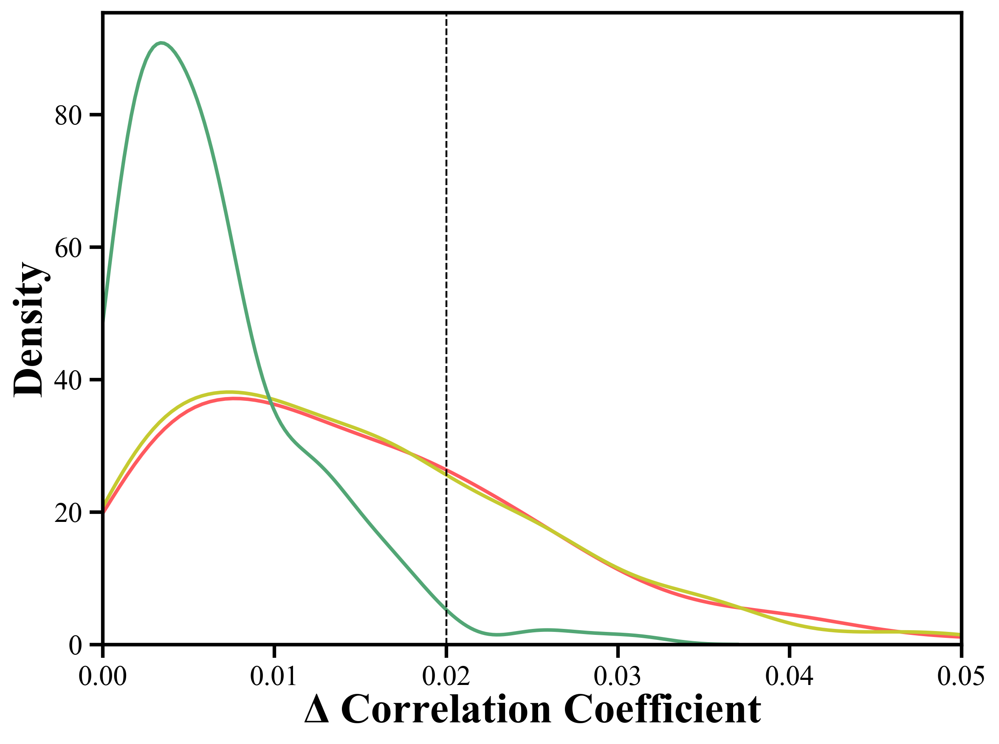

Running for linear ratio: 0.7
Running 15 tasks in parallel...


<Figure size 1800x1200 with 0 Axes>

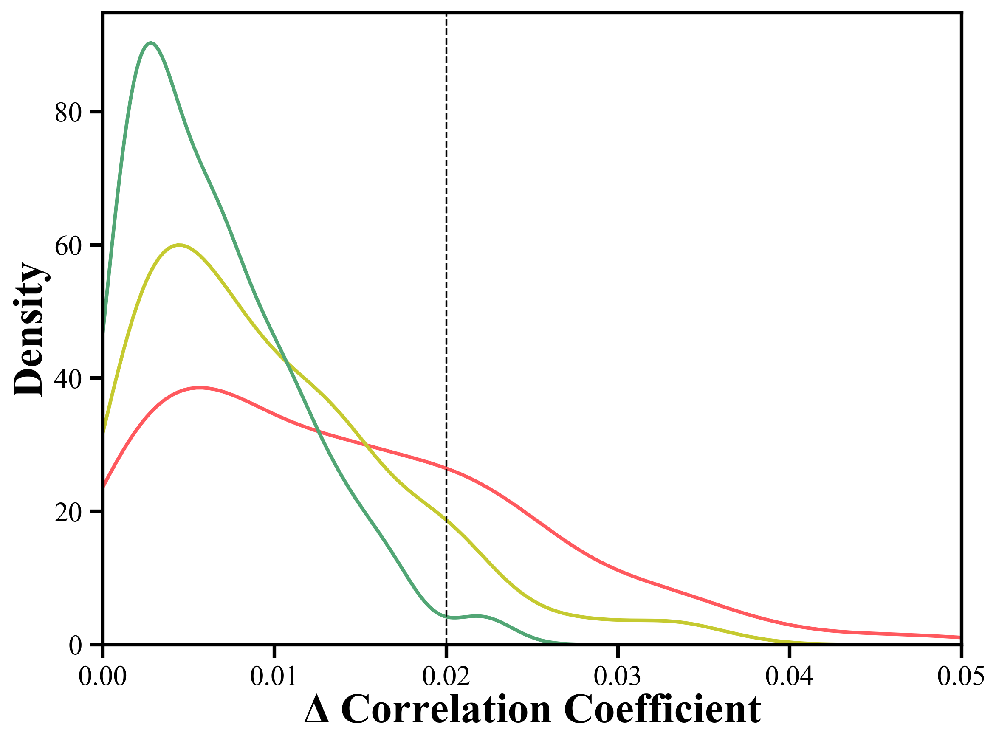

Running for linear ratio: 0.8
Running 15 tasks in parallel...


<Figure size 1800x1200 with 0 Axes>

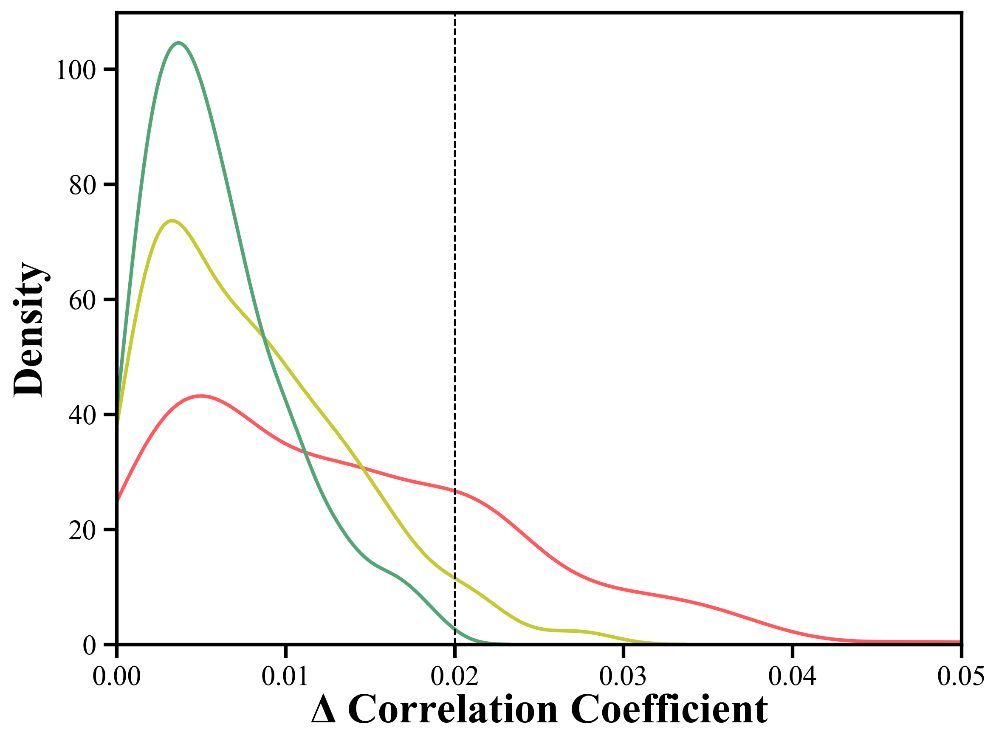

Running for linear ratio: 0.9
Running 15 tasks in parallel...


<Figure size 1800x1200 with 0 Axes>

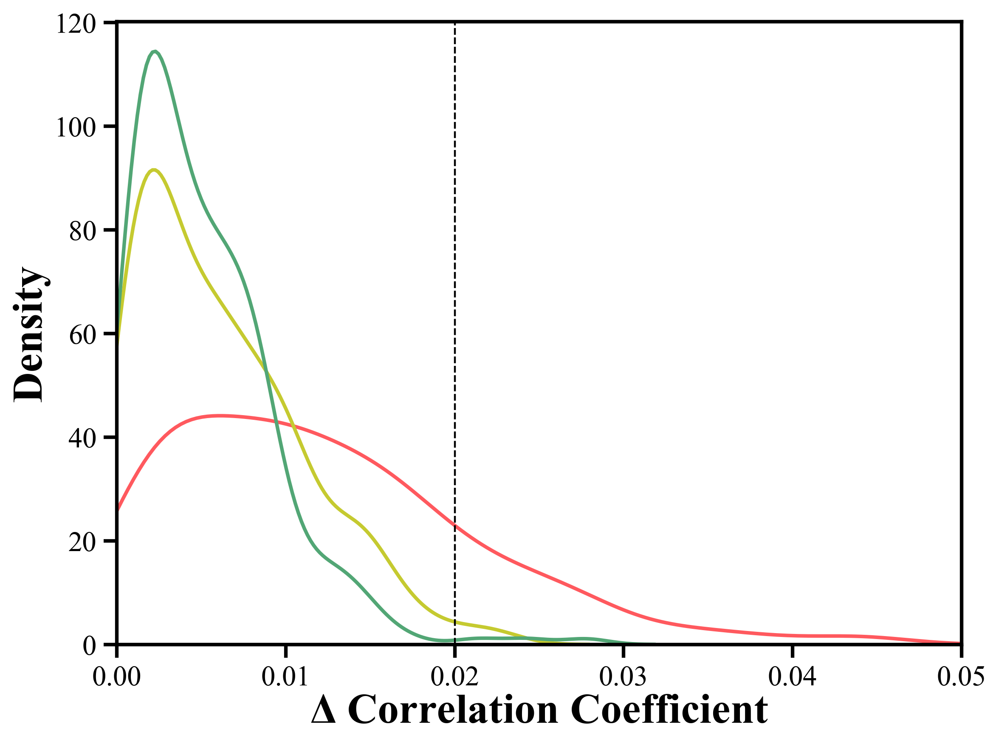

In [ ]:
colors = ["#ff595e","#c5ca30","#52a675"]
my_cmap = sns.color_palette(colors)
sns.set_palette(my_cmap)

for r in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
    print(f"Running for linear ratio: {r}")
    # seeds = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]  # 使用不同的种子进行实验
    seeds = [0, 1, 2, 3, 4]  # 使用不同的种子进行实验
    corr_funcs = [pearson_matrix, mutual_info_matrix, wd_corr_matrix]
    corr_names = ["Pearson", "MI", "WD"]
    # ratios = np.linspace(0, 1, 30)
    # print(ratios)
    ratios = [r]

    corr_results = run_all_corrs(
        seeds=seeds,
        n=500,
        m=10,
        ratios=ratios,
        corr_funcs=corr_funcs,
        corr_names=corr_names,
        n_jobs=-1
    )

    plt.figure(figsize=(6, 4))

    fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(8, 6), sharex=True, sharey=True)
    for i, (name, color) in enumerate(zip(corr_names, my_cmap)):

        sns.kdeplot(
            np.abs(np.concatenate(np.array(corr_results[name]))),  # 取绝对值
            color=color,
            label=name,
            ax=ax,
            alpha=1.0,
            linewidth=2
        )
        # for j in range(len(corr_results[name])):
        #     sns.kdeplot(
        #         np.abs(corr_results[name][j]),  # 取绝对值
        #         color=color,
        #         label=name if j == 0 else None,  # 只在第一个绘制标签
        #         ax=ax[i],
        #         alpha=0.5,
        #         linestyle="--"
        #     )
        # 加一条 x=0.02 的虚线
        ax.axvline(x=0.02, color='black', linestyle='--', linewidth=1)

    # plt.legend(loc="best", fontsize=14)
    plt.xlabel(r"$\Delta$ Correlation Coefficient")
    plt.ylabel("Density")
    plt.xlim(0, 0.05)
    plt.tight_layout()
    plt.show()
# plt.savefig("plots/corr_histplot.png", dpi=300, bbox_inches="tight")


Running 15 tasks in parallel...


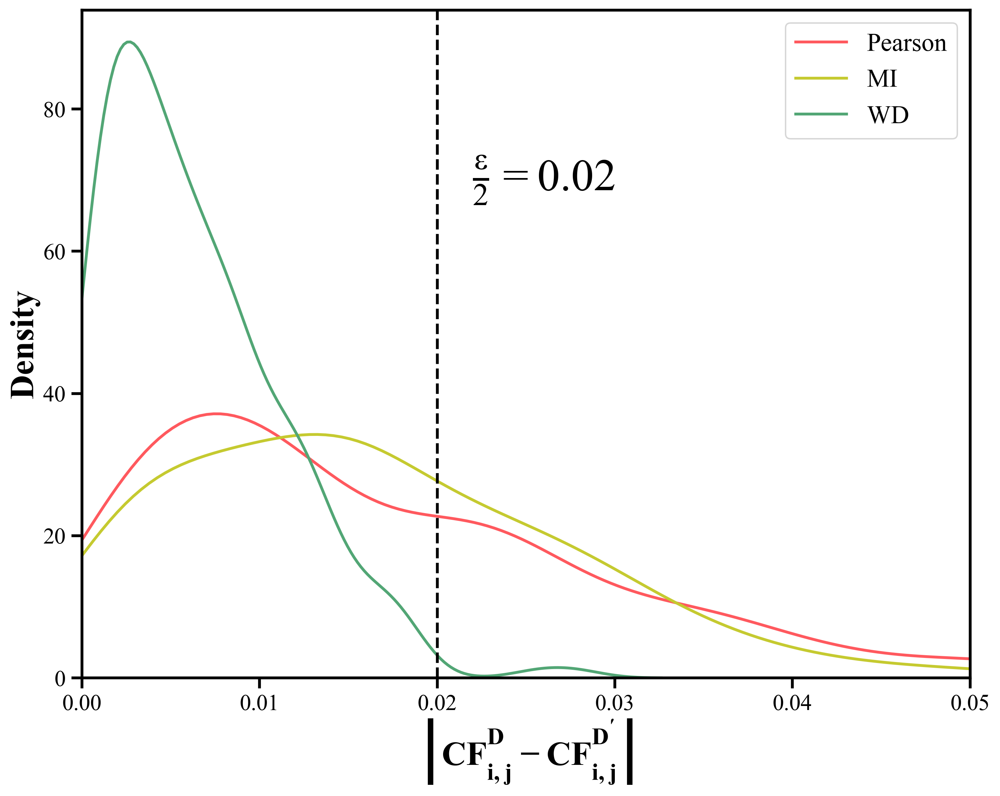

In [ ]:

# seeds = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]  # 使用不同的种子进行实验
seeds = [0, 1, 2, 3, 4]  # 使用不同的种子进行实验
corr_funcs = [pearson_matrix, mutual_info_matrix, wd_corr_matrix]
corr_names = ["Pearson", "MI", "WD"]
# ratios = np.linspace(0, 1, 30)
# print(ratios)
ratios = [0.5]
corr_results = run_all_corrs(
    seeds=seeds,
    n=500,
    m=10, 
    ratios=ratios,
    corr_funcs=corr_funcs,
    corr_names=corr_names,
    n_jobs=-1
)
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 8))
for i, (name, color) in enumerate(zip(corr_names, my_cmap)):
    sns.kdeplot(
        np.abs(np.concatenate(np.array(corr_results[name]))),  # 取绝对值
        color=color,
        label=name,
        ax=ax,
        alpha=1.0,
        linewidth=2
    )

# 加一条 x=0.02 的虚线
ax.axvline(x=0.02, color='black', linestyle='--', linewidth=2)
# add latex text
ax.text(0.022, 70, r"$\frac{\epsilon}{2}=0.02$", verticalalignment='center', fontsize=32)
plt.legend(loc="best", fontsize=18)
plt.xlabel(r"$\left | CF_{i,j}^{D}-CF_{i,j}^{D'} \right |$")
plt.ylabel("Density")
plt.xlim(0, 0.05)
plt.tight_layout()
plt.savefig("plots/corr_histplot.png", dpi=300, bbox_inches="tight")
plt.show()

In [ ]:
# def exp_thetas_and_linear_ratio(seed, n, m, thetas, linear_ratio):
#     # linear data
#     np.random.seed(seed)
#     linear_data = generate_regression_df(n=n, m=m, n_informative=m, noise=0)
#     random_data = generate_random_df(n=n, m=m)

#     # mix linear and random data
#     mixed_data = mix(linear_ratio, linear_data, random_data, seed=seed)
#     dcc_scores = []
#     for theta in thetas:
#         dcc_scores.append(repeated_avg_dcc(data=mixed_data, ratio=theta, eps=0.04))
#     return dcc_scores

# n = 500
# m = 10
# seeds = [0, 1, 2, 3, 4]
# plt.figure(figsize=(6, 4))
# linear_ratios = np.linspace(0, 1, 11)

# for linear_ratio in linear_ratios:
#     results = []
#     thetas = np.linspace(0.01, 0.50, 30)
#     for seed in seeds:
#         results.append(exp_thetas_and_linear_ratio(seed=seed, n=n, m=m, thetas=thetas, linear_ratio=linear_ratio))

#     results = np.array(results)


#     # scatter plot + error bars
#     plt.errorbar(thetas, results.mean(axis=0), yerr=results.std(axis=0), fmt='o', capsize=4, capthick=1, elinewidth=2, markersize=5, alpha=0.8, label=f"{linear_ratio:.1f}")

# plt.xlabel(r'$\theta$')
# plt.ylabel('DCC')
# # plt.ylim(0.25, 1.05)
# # add legend at the bottom the plot
# plt.legend(title="Linear ratio", bbox_to_anchor=(0.5, -0.4), loc="center", fontsize=10, title_fontsize=12, frameon=False, ncol=5)
# plt.savefig(f"plots/dcc_vs_thetas_linear_ratio.png", dpi=300, bbox_inches='tight')

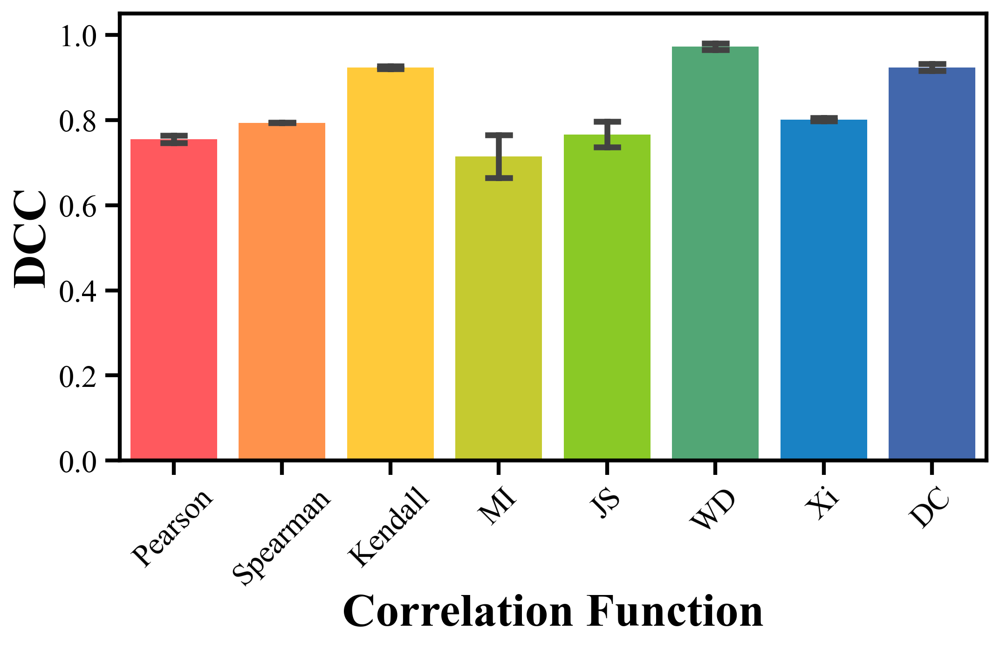

In [11]:
def exp_corr_methods(seed, n, m, corr_methods):
    # linear data
    np.random.seed(seed)
    linear_data = generate_regression_df(n=n, m=m, n_informative=m, noise=0)
    random_data = generate_random_df(n=n, m=m)

    # mix linear and random data
    mixed_data = mix(0.5, linear_data, random_data, seed=seed)
    dcc_scores = []
    for method in corr_methods:
        dcc_scores.append(repeated_avg_dcc(data=mixed_data, ratio=0.1, eps=0.04, corr_func=method))
    return dcc_scores

seeds = [0, 1, 2, 3, 4]
colors = ["#ff595e","#ff924c","#ffca3a","#c5ca30","#8ac926","#52a675","#1982c4","#4267ac","#6a4c93"]
my_cmap = sns.color_palette(colors)
sns.set_palette(my_cmap)
n = 500
m = 10
corr_methods = [pearson_matrix, spearman_matrix, kendall_matrix, mutual_info_matrix, js_corr_matrix, wd_corr_matrix, xi_matrix, dcor_matrix]
corr_names = ["Pearson", "Spearman", "Kendall", "MI", "JS", "WD", "Xi", "DC"]

results = []
for seed in seeds:
    results.append(exp_corr_methods(seed=seed, n=n, m=m, corr_methods=corr_methods))

results = np.array(results)
# Plot
plt.figure(figsize=(8, 4))

sns.barplot(data=results, orient="v", capsize=.2, errorbar='sd', saturation=1)
plt.xticks(ticks=np.arange(len(corr_names)), labels=corr_names, rotation=0)
# xtick rotation
plt.xticks(rotation=45)
plt.xlabel("Correlation Function")
plt.ylabel("DCC")
plt.ylim(0.0, 1.05)
plt.savefig("plots/dcc_vs_corr_methods.png", dpi=300, bbox_inches='tight')